In [1]:
# print cuda device
import torch
print(f"torch.cuda.is_available(): {torch.cuda.is_available()}")
print(f"torch.cuda.device_count(): {torch.cuda.device_count()}")
print(torch.cuda.get_device_name(torch.cuda.current_device()))

torch.cuda.is_available(): True
torch.cuda.device_count(): 8
NVIDIA A100-SXM4-80GB


In [2]:
from IPython.display import Video

import websocket #NOTE: websocket-client (https://github.com/websocket-client/websocket-client)
import uuid
import numpy as np
import json
import imageio

import urllib.request
import urllib.parse
import os, glob
import PIL
import io
import mediapy as media

server_address = "127.0.0.1:8788"

client_id = str(uuid.uuid4())

import json
from urllib import request, parse
import random
import copy
from IPython.display import JSON



json_file_path = "custom_workflows/causal_api_3.json"
try:
    with open(json_file_path, 'r') as file:
        base_prompt = json.load(file)
except FileNotFoundError:
    print(f"The file {json_file_path} was not found.")
except json.JSONDecodeError:
    print("An error occurred while decoding the JSON data.")

JSON(base_prompt)

def makePrompt(base_prompt, positive_prompt=None, seed=None, num_frames=None):
    prompt = copy.deepcopy(base_prompt)
    if prompt is not None:
        prompt[by_title(base_prompt, "CLIP Text Encode (Prompt)")]["inputs"]["text"] = positive_prompt
    if seed is not None:
        prompt[by_type(base_prompt, "KSampler")]["inputs"]["seed"] = seed
    if num_frames is not None:
        prompt[by_type(base_prompt, "EmptyLatentImage")]["inputs"]["batch_size"] = num_frames
    return prompt

def by_type(prompt, type):
    for id in prompt:
        value = prompt[id]
        if value["class_type"] == type:
            return id
    return None

def by_title(prompt, title):
    for id in prompt:
        value = prompt[id]
        if value["_meta"] != None:
            if value["_meta"]["title"] == title:
                return id
    return None


def queue_prompt(prompt):
    p = {"prompt": prompt, "client_id": client_id}
    data = json.dumps(p).encode('utf-8')
    req =  urllib.request.Request("http://{}/prompt".format(server_address), data=data)
    return json.loads(urllib.request.urlopen(req).read())

def get_image(filename, subfolder, folder_type):
    data = {"filename": filename, "subfolder": subfolder, "type": folder_type}
    # print(data)
    return media.read_video(os.path.join(folder_type, subfolder, filename))
    url_values = urllib.parse.urlencode(data)
    with urllib.request.urlopen("http://{}/view?{}".format(server_address, url_values)) as response:
        return response.read()

def get_history(prompt_id):
    with urllib.request.urlopen("http://{}/history/{}".format(server_address, prompt_id)) as response:
        return json.loads(response.read())

# TODO: parallelize
def get_images(ws, prompt):
    prompt_id = queue_prompt(prompt)['prompt_id']
    output_images = {}
    while True:
        out = ws.recv()
        if isinstance(out, str):
            message = json.loads(out)
            if message['type'] == 'executing':
                data = message['data']
                if data['node'] is None and data['prompt_id'] == prompt_id:
                    break #Execution is done
        else:
            continue #previews are binary data

    history = get_history(prompt_id)[prompt_id]
    print(history['outputs'])
    for o in history['outputs']:
        for node_id in history['outputs']:
            node_output = history['outputs'][node_id]
            if 'gifs' in node_output:
                gifs_output = []
                for gif in node_output['gifs']:
                    gif_data = get_image(gif['filename'], gif['subfolder'], gif['type'])
                    gifs_output.append(gif_data)
                output_images[node_id] = gifs_output
            elif 'images' in node_output:
                images_output = []
                for image in node_output['images']:
                    image_data = get_image(image['filename'], image['subfolder'], image['type'])
                    images_output.append(image_data)
                output_images[node_id] = images_output

    return output_images

try:
    with open(json_file_path, 'r') as file:
        prompt = json.load(file)
except FileNotFoundError:
    print(f"The file {json_file_path} was not found.")
except json.JSONDecodeError:
    print("An error occurred while decoding the JSON data.")
        

ws = websocket.WebSocket()
print("Finished setting up web socket!!")
ws.connect("ws://{}/ws?clientId={}".format(server_address, client_id))

import mediapy as media

def call(positive_prompt, seed, num_frames):
    images = get_images(ws, makePrompt(base_prompt, positive_prompt=positive_prompt, seed=seed, num_frames=num_frames))
    frames = []
    for node_id in images:
        for i, image_data in enumerate(images[node_id]):
            frames.append(image_data)
    return frames

def set_surgery(options):
    data = json.dumps(options).encode('utf-8')
    req =  urllib.request.Request("http://{}/surgery".format(server_address), data=data)
    return json.loads(urllib.request.urlopen(req).read())



Finished setting up web socket!!


In [3]:
# TODO: package into a function
# TODO: generate next frame as soon as it's ready.

# concat frames with numpy
set_surgery({
    "force_causal": True, 
    "skip_vanilla_temporal_module": False, 
    "save_motion_module": True,
})
seed = 731168232970895
prompt = "biking down new york city street, pov, 4k"
# frames_32 = np.concatenate(
#     call(prompt, seed, 32)
#     )
frames_16 = np.concatenate(
    call(prompt, seed, 16)
    )
# frames_8 = np.concatenate(
#     call(prompt, seed, 8)
#     )

# # frames = np.concatenate(call(prompt, seed, 16) + call(prompt, seed, 1), axis=0)
# frames = np.concatenate(call(prompt, seed, 1) + call(prompt, seed, 1) + call(prompt, seed, 1) + call(prompt, seed, 1), axis=0)


{'77': {'gifs': [{'filename': 'AnimateDiff_00052.gif', 'subfolder': '', 'type': 'output', 'format': 'image/gif'}]}}


rootId: gifViewer_a36edf3d-a6b8-4b9a-a0a7-f1fe4fb2b97c



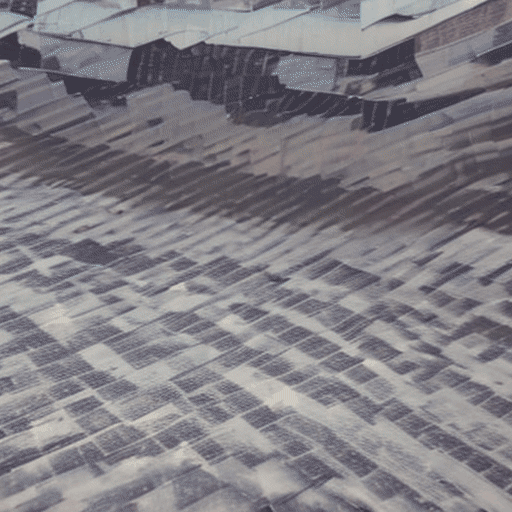
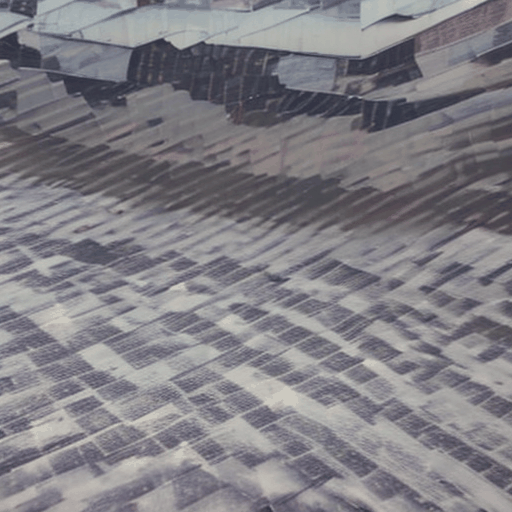
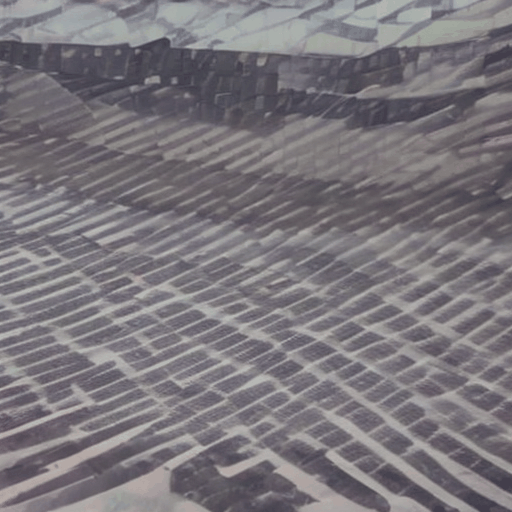
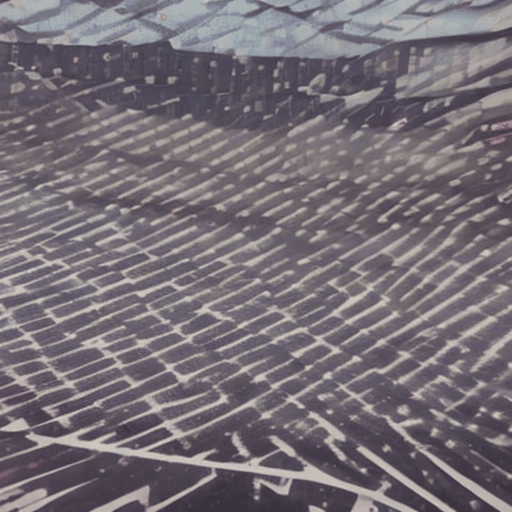
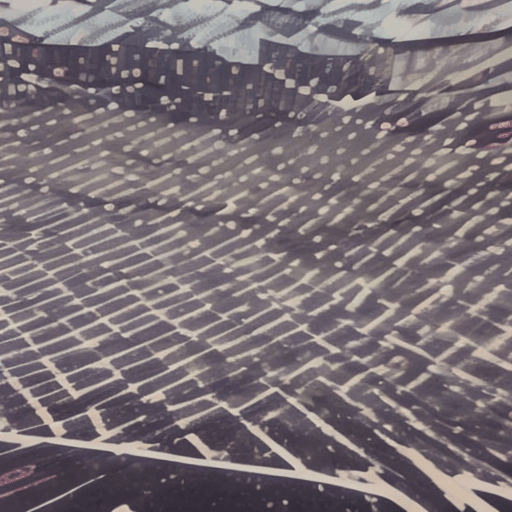
...
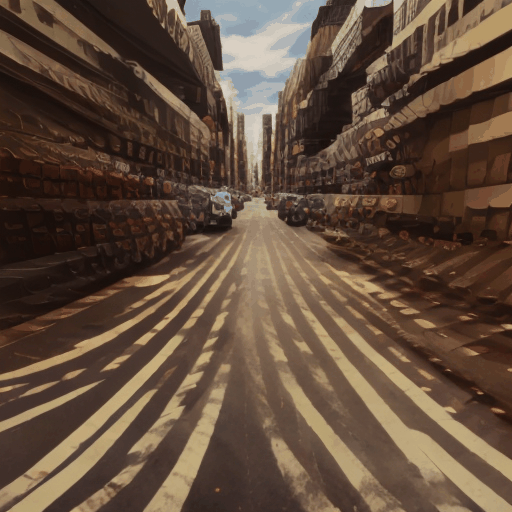
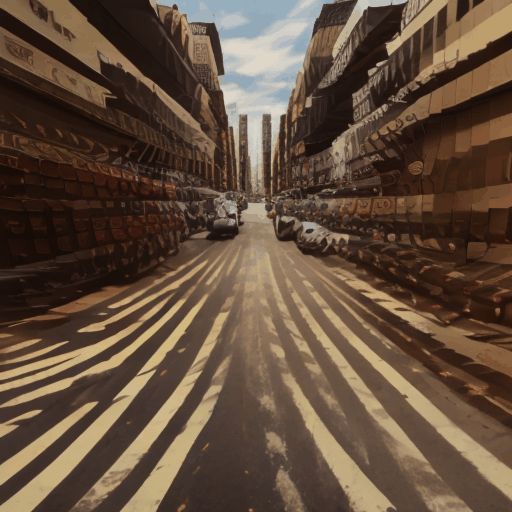
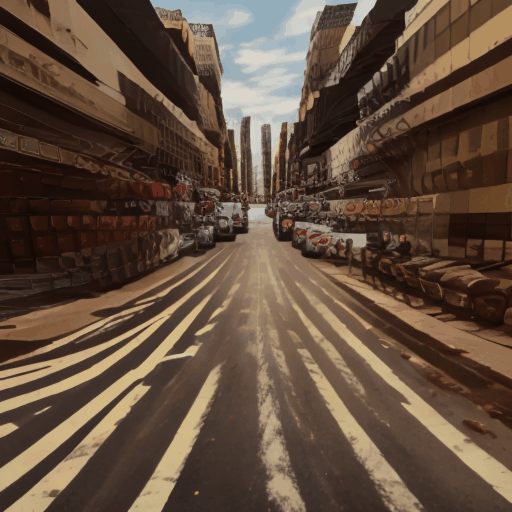
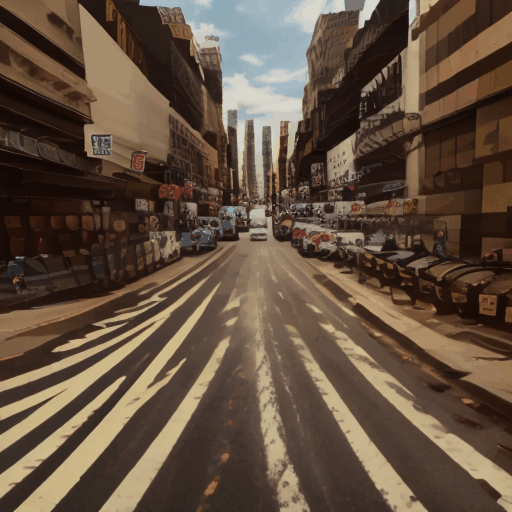
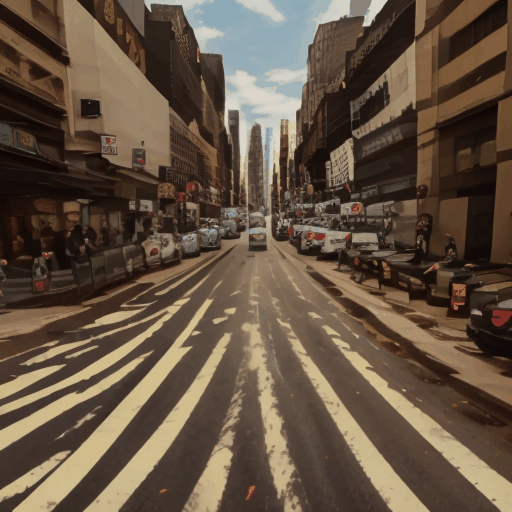

In [4]:
import numpy as np
from IPython.display import display, HTML
from PIL import Image
import base64
from io import BytesIO
import uuid

def numpy_array_to_base64_img(array):
    pil_img = Image.fromarray(array)
    buffer = BytesIO()
    pil_img.save(buffer, format="PNG")
    return base64.b64encode(buffer.getvalue()).decode()

def view_gif(frames):
    width, height, channels = frames.shape[1:]
    base64_images = [numpy_array_to_base64_img(frame) for frame in frames]
    frames_html = ''.join([f'<img src="data:image/png;base64,{img}" style="width: {width}px; height: {height}px;" />' for img in base64_images])

    # Save gif to a file based on time
    import time
    filename = f"{time.strftime('%Y-%m-%d_%H-%M-%S')}.gif"
    path = f"experiments/{filename}"
    media.write_video(path, frames, fps=2, codec='gif')

    # base64 encode the gif
    gif_base64 = base64.b64encode(open(path, 'rb').read()).decode()

    rootId = f"gifViewer_{uuid.uuid4()}"
    print(f"rootId: {rootId}")
    
    html = f"""
    <div id="{rootId}" style="position: relative; width: {width}px; height: {height}px;">
        <a href="data:image/gif;base64,{gif_base64}" download="{path}">Download GIF</a>
        {frames_html}
        <div id="frameIndicator" style="position: absolute; top: 10px; right: 10px; background-color: rgba(0, 0, 0, 0.5); color: white; padding: 5px 10px; border-radius: 10px;">
            1/{len(frames)}
        </div>
        <script>
            function main() {{
                const root = document.getElementById('{rootId}');
                var currentIndex = 0;
                var frames = root.querySelectorAll('img');
                var frameIndicator = document.getElementById('frameIndicator');
                function showFrame(index) {{
                    frames.forEach((frame, i) => {{
                        frame.style.display = i === index ? 'block' : 'none';
                    }});
                    frameIndicator.innerText = (index + 1) + '/' + frames.length;
                }}
                showFrame(currentIndex);
                
                document.addEventListener('keydown', (event) => {{
                    if(event.key === 'ArrowRight') {{
                        currentIndex = (currentIndex + 1) % frames.length;
                        showFrame(currentIndex);
                    }} else if(event.key === 'ArrowLeft') {{
                        currentIndex = (currentIndex - 1 + frames.length) % frames.length;
                        showFrame(currentIndex);
                    }}
                }});
            }}
            main();
        </script>
    </div>
    """
    
    display(HTML(html))

# Example usage:
# Assuming `frames_np` is your numpy array of shape (frame_count, width, height, channels)
# You can create a dummy array for demonstration like this:
# frames_np = np.random.randint(0, 255, (5, 100, 100, 3), dtype=np.uint8)

# view_gif(frames_32)
view_gif(frames_16)
# view_gif(frames_8)
